In [ ]:
import os, sys
currentdir = os.path.dirname(os.path.abspath(os.getcwd()))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0, currentdir) 
sys.path.insert(0, parentdir) 
sys.path.insert(0, currentdir + "\Code") 

## Analyze attractor robustness under state noise

In [ ]:
import math
import pickle
import numpy as np
import sklearn.decomposition
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import cm
from matplotlib import rc
import matplotlib as mpl
import matplotlib.lines as mlines
from matplotlib.ticker import LinearLocator
import scipy
from scipy.integrate import odeint, DOP853, solve_ivp
from scipy.stats import special_ortho_group
from itertools import chain, combinations, permutations
import seaborn as sns
from joblib import Parallel, delayed

"cmap = 'gray'\nrc('font', **{'family': 'serif', 'serif': ['Computer Modern']})\nrc('text', usetex=True)"

In [ ]:
# symmetric cosine weight matrix W sym jk = JI + JE cos(theta_j - theta_K)
# where JE and JI respectively control the strength of the tuned and untuned components of recurrent connectivity between neurons with preferred headings theta_j and theta_k.

# For a network of size N , there are N 3 such “optimal” values of local excitation J*E

# The parameters (JI, JE) can be set such that this system will generate a population profile that qualitatively looks like a discretely sampled “bump” of activity.
# (JI, JE) are within the subset  \Omega = \OmegaJI\times\OmegaJE \subset (−1, 1) \times (2,1)

def get_corners(N, m):
    #works for even N
    corners = []
    corner_0 = np.array([m]*N)
    corner_0[int(N/2):] *= -1
    corner_0[int(N/2)-int(N/4):int(N/2)] = 0
    corner_0[N-int(N/4):] = 0
    for support_j in range(N):
        corners.append(np.roll(corner_0, support_j))
    corners = np.array(corners)
    return corners

def get_bumps_along_oneside_ring(N, m, corners, step_size=0.1):
    x = np.arange(0, m+step_size, step_size)
    n_xs = x.shape[0]
    bumps = np.zeros((N, n_xs))
    for i, x_i in enumerate(x):
        for j in range(N):
            bumps[j,i] = np.interp(x_i, [0,m], [corners[0][j],corners[1][j]])
    return bumps

def get_all_bumps(N, bumps):
    all_bumps = []
    for support_j in range(N):
        for bump_i in range(bumps.shape[1]):
            all_bumps.append(np.roll(bumps[:,bump_i], support_j))
    all_bumps = np.array(all_bumps)
    return all_bumps

def get_all_bumps_2darray(N, bumps):
    all_bumps = np.zeros((N,bumps.shape[1],N))
    for support_j in range(N):
        for bump_i in range(bumps.shape[1]):
            all_bumps[support_j,bump_i] = np.roll(bumps[:,bump_i], support_j)
    return all_bumps

def get_noorman_symmetric_weights(N, J_I = 1, J_E = 1):
    # W sym jk = JI + JE cos(theta_j - theta_K)
    x = np.arange(0,N,1)
    row = J_I + J_E*np.cos(2*np.pi*x/N)
    W = scipy.linalg.circulant(row)
    return W


# W asym jk =sin(theta_j - theta_k)
def get_noorman_asymmetric_weights(N):
    # W asym jk =sin(theta_j - theta_k)
    x = np.arange(0,N,1)
    row = np.sin(2*np.pi*x/N)
    W = scipy.linalg.circulant(row)
    return W

def noorman_ode(t,x,tau,transfer_function,W_sym,W_asym,c_ff,N):
    """Differential equation of head direction network in Noorman et al., 2022. 
    tau: integration constant
    transfer_function: each neuron transforms its inputs via a nonlinear transfer function
    W_sym, W_asym: symmetric and asymmetric weight matrices
    v_in: input
    c_ff: a constant feedforward input to all neurons in the network
    N: number of neurons in the network
    """

    return (-x + np.dot(W_sym+v_in(t)*W_asym, transfer_function(x))/N + c_ff)/tau

def noorman_ode_with_noise(t,x,tau,transfer_function,W_sym,W_asym,c_ff,N,noises):
    """Differential equation of head direction network in Noorman et al., 2022. 
    tau: integration constant
    transfer_function: each neuron transforms its inputs via a nonlinear transfer function
    W_sym, W_asym: symmetric and asymmetric weight matrices
    v_in: input
    c_ff: a constant feedforward input to all neurons in the network
    N: number of neurons in the network
    """
    if noises is not None:
        index = int(min(max(round(t), 0), len(noises)-1))
        noises_at_t = noises[index]  # Now this is guaranteed to be valid
        return (-x + np.dot(W_sym+v_in(t)*W_asym, transfer_function(x))/N + c_ff + noises_at_t)/tau
    else:
        return (-x + np.dot(W_sym+v_in(t)*W_asym, transfer_function(x))/N + c_ff)/tau

# Fixed points and their stabilities
def noorman_jacobian(x, W_sym):
    N = W_sym.shape[0]
    
    r = np.where(x>0)
    W_sub = np.zeros((N,N))
    W_sub[:,r] = W_sym[:,r]
    J = -np.eye(N)
    J += W_sub/N
    return J

def powerset(iterable):
    "powerset([1,2,3]) --> () (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)"
    s = list(iterable)
    return chain.from_iterable(combinations(s, r) for r in range(len(s)+1))

def noorman_fixed_points(W_sym, c_ff):
    """
    Takes as argument all the parameters of the recurrent part of the model (W_sym, c_ff)
    \dot x = -x + 1/N W_sym ReLU(x) + c_ff = 0
    """
    fixed_point_list = []

    N = W_sym.shape[0]
    subsets = powerset(range(N))
    for support in subsets:
        if support == ():
            continue
        r = np.array(support)
        
        W_sub = np.zeros((N,N))
        W_sub[:,r] = W_sym[:,r]
        A = W_sub/N - np.eye(N)
        fixed_point = -np.dot(np.linalg.inv(A), np.ones(N)*c_ff)
        
        #check true fixed point
        negativity_condition = True
        # print(r, [item for item in range(N) if item not in r])
        for i in r:
            if fixed_point[i] <= 0:
                negativity_condition = False
        for i in [item for item in range(N) if item not in r]:
            if fixed_point[i] >= 0:
                negativity_condition = False
        
        if negativity_condition:
            fixed_point_list.append(fixed_point)
        
    fixed_point_array = np.array(fixed_point_list)
    return fixed_point_array

def bump_perturbation(x, center, rotation_mat, amplitude, b=1):
    """
    Perturbation is composed of parallel vector field 
    with the location given by center, 
    the norm of the vectors determined by a bump function
    and the orientation given by theta
    
    x.shape = (Numberofpoints,N)
    rotation_mat: orientation of perturbation
    implemented for N-dimensional systems
    """
    N = x.shape[0]
    vector_bump = np.zeros(N)
    vector_bump[0] = 1.
    rotation_mat = special_ortho_group.rvs(N)
    vector_bump = np.dot(vector_bump, rotation_mat)
    vector_bump = np.multiply(vector_bump, bump_function(x, center=center, amplitude=amplitude, b=b))
    
    return vector_bump

# we will take phi(·) to be threshold linear

def v_in(t):
    return 0

def ReLU(x):
    return np.where(x<0,0,x)



# Get trajectories with state noise

In [16]:
def get_network(N,J_E,J_I):
    W_sym = get_noorman_symmetric_weights(N, J_I, J_E)
    W_asym = get_noorman_asymmetric_weights(N)
    c_ff = 1.

    maxT = 100
    n_timesteps = 100
    t = np.linspace(0, maxT, n_timesteps)

    y0 = np.random.uniform(0,1,N)

    sol = solve_ivp(noorman_ode, y0=y0,  t_span=[0,maxT], t_eval=t, args=tuple([tau, transfer_function, W_sym, W_asym, c_ff, N]),dense_output=True)

    m = np.max(sol.sol(t)) # m #round? what should the maximum be according to the paper?
    corners = get_corners(N, m)
    bumps = get_bumps_along_oneside_ring(N, m, corners, step_size=0.05)
    step_size = .1
    x = np.arange(0, m+step_size, step_size)
    all_bumps = get_all_bumps(N, bumps)
    return corners, all_bumps, W_sym, W_asym, t

def get_network_with_automatic_corners(N,J_E,J_I,t):
    W_sym = get_noorman_symmetric_weights(N, J_I, J_E)
    W_asym = get_noorman_asymmetric_weights(N)
    c_ff = 1.

    y0 = np.random.uniform(0,1,N)

    sol = solve_ivp(noorman_ode, y0=y0,  t_span=[0,t[-1]], t_eval=t, args=tuple([tau, transfer_function, W_sym, W_asym, c_ff, N]),dense_output=True)

    corners=[]
    for support_j in range(N):
        corners.append(np.roll(sol.sol(t)[:,-1], support_j))
    corners = np.array(corners)

    m = np.max(sol.sol(t)) # m #round? what should the maximum be according to the paper?
    bumps = get_bumps_along_oneside_ring(N, m, corners, step_size=m/3)
    all_bumps = get_all_bumps(N, bumps)

    return corners, all_bumps, W_sym, W_asym

def get_weight_perturbation(norm,W_sym_max,N):
    eps = np.random.uniform(-1,1,(N,N))
    eps /= np.linalg.norm(eps)
    eps *= norm * W_sym_max / 100 # perturbation norm as percentage of maximum neural activity
    return eps

def get_state_perturbation(norm,corners_max,N,t):
    eps = np.random.uniform(-1,1,(len(t)+1,N))
    eps /= np.linalg.norm(eps)
    eps *= norm * corners_max / 100 # define norm as percentage of maximum activity
    return eps

def get_trajectories(all_bumps,W_sym, W_asym, external_t, N, pert, noises):

    trajectories = np.zeros((all_bumps.shape[0], len(external_t), N))
    
    for i in range(all_bumps.shape[0]):
        sol = solve_ivp(noorman_ode_with_noise, y0=all_bumps[i,:],  t_span=[0,external_t[-1]], t_eval=external_t, args=tuple([tau, transfer_function, W_sym+pert, W_asym, c_ff, N, noises]),dense_output=True)
        trajectories[i] = sol.sol(external_t).T
    return trajectories

In [17]:
import numpy as np
from scipy.optimize import curve_fit

def von_mises(x, A, kappa, mu, C):
    """Von Mises function (circular Gaussian-like)"""
    return A * np.exp(kappa * (np.cos(x - mu) - 1)) + C

import numpy as np

def get_angle_from_bump(activity, sigma_smooth=3):
    """
    Compute the center of mass (CoM) and smooth peak location for a bump in a ring attractor.

    Parameters:
        activity (1D numpy array): Activity values along the ring.
        sigma_smooth (float): Smoothing width for peak estimation (default: 3).

    Returns:
        com_angle (float): Center of mass in radians.
        peak_smooth (float): Smoothed peak location in radians.
    """
    N = len(activity)
    angles = np.linspace(0, 2 * np.pi, N, endpoint=False)  # Circular angles

    # Compute circular center of mass (CoM)
    x_com = np.sum(np.cos(angles) * activity)
    y_com = np.sum(np.sin(angles) * activity)
    com_angle = np.arctan2(y_com, x_com)

    # Find initial peak location
    peak_idx = np.argmax(activity)
    
    # Define Gaussian weights centered on peak
    idxs = np.arange(N)
    distances = np.minimum(np.abs(idxs - peak_idx), N - np.abs(idxs - peak_idx))  # Circular distance
    weights = np.exp(-0.5 * (distances / sigma_smooth) ** 2)  # Gaussian weights
    
    # Compute weighted average of angles
    peak_smooth = np.arctan2(
        np.sum(weights * np.sin(angles) * activity),
        np.sum(weights * np.cos(angles) * activity)
    )

    return com_angle, peak_smooth

def get_angle_diffs(trajectories):
    centre_of_mass_diffs, peak_location_diffs = [], []
    for trajectory in trajectories:
        initial_state = trajectory[0]
        final_state = trajectory[-1]
        centre_of_mass_initial, peak_location_initial = get_angle_from_bump(initial_state)
        centre_of_mass_final, peak_location_final = get_angle_from_bump(final_state)

        centre_of_mass_diff = np.abs(centre_of_mass_final-centre_of_mass_initial)
        centre_of_mass_diff = np.min([centre_of_mass_diff, 2*np.pi-centre_of_mass_diff])
        centre_of_mass_diffs.append(np.degrees(centre_of_mass_diff))

        peak_location_diff = np.abs(peak_location_final-peak_location_initial)
        peak_location_diff = np.min([peak_location_diff, 2*np.pi-peak_location_diff])
        peak_location_diffs.append(np.degrees(peak_location_diff))

    return centre_of_mass_diffs, peak_location_diffs

In [18]:
def plot_trajectory_and_invariant_manifold(corners,inv_man,fixed_points,trajectories,trajectory_index,N, W_sym,intermediate_timestep):

    pca = sklearn.decomposition.PCA(n_components=2)

    corners_proj = pca.fit_transform(corners)

    if fixed_points is not None:
        fixed_points_proj = pca.transform(fixed_points.reshape(-1,N))

    points_on_manifold_proj = pca.transform(inv_man)

    trajectory_states_proj = pca.transform(trajectories[trajectory_index])
    final_trajectory_state_proj = pca.transform(trajectories[trajectory_index,-1].reshape(-1,N))
    initial_trajectory_state_proj = pca.transform(trajectories[trajectory_index,0].reshape(-1,N))
    intermediate_trajectory_state_proj = pca.transform(trajectories[trajectory_index,intermediate_timestep].reshape(-1,N))

    for i in range(points_on_manifold_proj.shape[0]):
        plt.plot(points_on_manifold_proj[i,0], points_on_manifold_proj[i,1], '.', color='m', label="Analytical", zorder=99, alpha=0.1, markersize= 5)

    for i in range(N):
        plt.plot([corners_proj[i-1,0], corners_proj[i,0]],
                [corners_proj[i-1,1], corners_proj[i,1]],
                'k', label="Original attractor", zorder=0, alpha=0.1, linewidth=10, 
                solid_capstyle='round')

    if fixed_points is not None:
        for i in range(fixed_points.shape[0]):
            eigenvalues, _ = scipy.linalg.eig(noorman_jacobian(fixed_points[i], W_sym))
            if np.all(np.real(eigenvalues)<0):
                plt.plot(fixed_points_proj[i,0], fixed_points_proj[i,1], '*', color="darkblue", label="Stable", zorder=10, alpha=1., markersize=15) # final states of the trajectories 
            else:
                plt.plot(fixed_points_proj[i,0], fixed_points_proj[i,1], '*', color="darkorange", label="Stable", zorder=10, alpha=1., markersize=15) # final states of the trajectories 
            
    #plt.plot(fixed_point_proj[:,0], fixed_point_proj[:,1], '^b', label="Stable", zorder=10, alpha=1., markersize=20) # final states of the trajectories 
    
    plt.plot(trajectory_states_proj[:,0], trajectory_states_proj[:,1], '.k', label="Stable", zorder=10, alpha=1., markersize=10) # final states of the trajectories 
    plt.plot(initial_trajectory_state_proj[:,0], initial_trajectory_state_proj[:,1], '.g', label="Stable", zorder=10, alpha=1., markersize=20) # final states of the trajectories 
    plt.plot(intermediate_trajectory_state_proj[:,0], intermediate_trajectory_state_proj[:,1], '.m', label="Stable", zorder=10, alpha=1., markersize=20) # final states of the trajectories 
    plt.plot(final_trajectory_state_proj[:,0], final_trajectory_state_proj[:,1], '.r', label="Stable", zorder=10, alpha=1., markersize=20) # final states of the trajectories 


In [19]:
def get_speed_and_acceleration(trajectory):
    speeds = []
    accelerations = []
    for t in range(trajectory.shape[0]-1):
        speed = np.linalg.norm(trajectory[t+1, :]-trajectory[t, :])
        speeds.append(speed)
    for t in range(trajectory.shape[0]-2):
        acceleration = np.abs(speeds[t+1]-speeds[t])
        accelerations.append(acceleration)
    speeds = np.array(speeds)
    accelerations = np.array(accelerations)
    return speeds, accelerations

def get_speed_and_acceleration_batch(trajectories):
    all_speeds = []
    all_accs = []
    for trajectory in trajectories:
        speeds, accelerations = get_speed_and_acceleration(trajectory)
        all_speeds.append(speeds)
        all_accs.append(accelerations)
    return np.array(all_speeds), np.array(all_accs)

def detect_slow_manifold(trajectories, subsample=10, tol=0):
    # for each trajectory, gets the index at which the speed starts to be low enough & 
    # from those points extract all onwards timesteps, with steps of 10 timesteps 
    all_speeds, all_accs = get_speed_and_acceleration_batch(trajectories)
    idx = np.argmax(all_speeds - all_speeds[:,-1][:,np.newaxis] < tol,axis=1)
    inv_man = np.empty((0,trajectories.shape[-1]))
    for i,index in enumerate(idx):
        inv_man = np.vstack([inv_man, trajectories[i,index::subsample,:]])
    return inv_man

def detect_slow_manifold_keep_time(trajectories, tol=0):
    all_speeds, all_accs = get_speed_and_acceleration_batch(trajectories)
    idx = np.argmax(all_speeds - all_speeds[:,-1][:,np.newaxis] < tol,axis=1)
    s = all_speeds - all_speeds[:,-1][:,np.newaxis]
    inv_man = []#np.empty((0,trajectories.shape[-1]))
    for i,index in enumerate(idx):
        inv_man.append(trajectories[i,index:index+2,:])
    return np.array(inv_man)

### Define parameters

In [ ]:
tau, c_ff = 0.1, 1
transfer_function = ReLU
maxT = 0.010
n_timesteps = 2
t = np.linspace(0,maxT,n_timesteps)
num_seeds = 10
np.random.seed(0)
seeds = np.random.randint(0, 2**15, size=num_seeds)
N_range = np.arange(6,18,2)
timescale = "short-term"

# Perturbations
weight_norms = [1,3,5,10,20]
state_norms = [1,3,5,10,20]
JEs = 4 + np.array([-20,-10,-5,-3,-1,1,3,5,10,20]) / 100 * 4
JIs = -2.4 + np.array([-20,-10,-5,-3,-1,1,3,5,10,20]) / 100 * 2.4

# Get results for one (seed,norm) combination

12


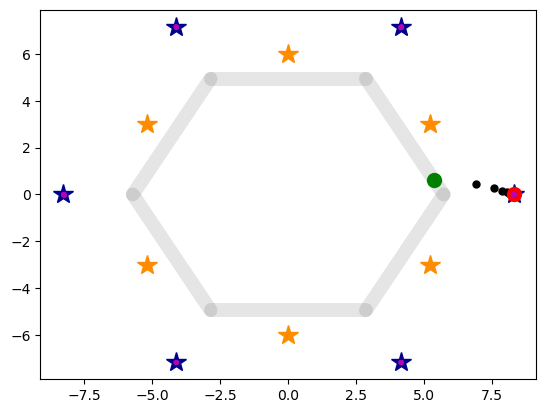

In [ ]:
J_E, J_I = 4.5, -2
weight_norm, state_norm = 5, 5

corners, all_bumps, W_sym, W_asym = get_network_with_automatic_corners(N,J_E,J_I,t)
W_sym_max = np.abs(W_sym).max()
corners_max = np.abs(corners).max()

pert = get_weight_perturbation(weight_norm,W_sym_max,N)
noises = get_state_perturbation(state_norm,corners_max,N,t)

trajectories = get_trajectories(all_bumps,W_sym, W_asym, t, N, pert, noises) 
fixed_points = noorman_fixed_points(W_sym, c_ff)[:-1]

inv_man = detect_slow_manifold(trajectories,tol=1e-2)
trajectory_index=0
plot_trajectory_and_invariant_manifold(corners,inv_man,fixed_points,trajectories,trajectory_index,N)

angle_diffs = np.array(get_angle_diffs(trajectories))[0]

# Get results for several combinations

## Simulate attractors with perturbations: get short- & long-term trajectories

In [ ]:
np.random.seed(0)

In [ ]:
def get_results(N,J_E,J_I,weight_norms,state_norms,t):
    results = {}
    for weight_norm in weight_norms:
        for state_norm in state_norms:
            corners, all_bumps, W_sym, W_asym = get_network_with_automatic_corners(N,J_E,J_I,t)
            W_sym_max = np.abs(W_sym).max()
            corners_max = np.abs(corners).max()

            pert = get_weight_perturbation(weight_norm,W_sym_max,N)
            noises = get_state_perturbation(state_norm,corners_max,N,t)

            trajectories = get_trajectories(all_bumps,W_sym, W_asym, t, N, pert, noises) 
            results[(N,J_E,J_I,weight_norm,state_norm)] = trajectories

    with open("results//{}//weight_state_noise_per_step//angle_errors_{}_{}_{}.pkl".format(timescale,N,round(J_E,2),round(J_I,2)), "wb") as f:
        pickle.dump(results, f)

Js = [(J_E,J_I) for J_E in JEs for J_I in JIs]
for N in N_range:
    print(N)
    Parallel(n_jobs=-1)(delayed(get_results)(N,J_E,J_I,weight_norms,state_norms,t) for J_E, J_I in Js)

6


KeyboardInterrupt: 

## Medium-term: get attractor fixed points

In [ ]:
def get_fixed_points(N,J_E,J_I,weight_norm,t):
   corners, all_bumps, W_sym, W_asym = get_network_with_automatic_corners(N,J_E,J_I,t)
   W_sym_max = np.abs(W_sym).max()
   corners_max = np.abs(corners).max()
   pert = get_weight_perturbation(weight_norm,W_sym_max,N)

   if (N < 20) and ((J_E != 4) and (J_I != -2.4)):
       try:
           fixed_points = noorman_fixed_points(W_sym+pert, c_ff)[:-1]
       except:
           fixed_points = None
   else:
       fixed_points = None
   return fixed_points

for N in N_range:
   for J_E in JEs:
       for J_I in JIs:
           results = {}
           for weight_norm in weight_norms:
               print(N,J_E,J_I,weight_norm)
               results[(N,J_E,J_I,weight_norm)] = get_fixed_points(N,J_E,J_I,weight_norm,t)
           with open("results//short-term//fixed_points//{}_{}_{}.pkl".format(N,round(J_E,2),round(J_I,2)), "wb") as f:
               pickle.dump(results, f)
           del results

## Analyze results

### Long-term: fixed points

#### Number of fixed points for all (N,J_E,J_I,weight_norm) combinations

In [ ]:
# Extract valid combinations from all Ns, i.e. combinations that lead to non-zero fixed points (zero fixed points could happen either because the weight matrix is symmetric, or because there is just an invariant manifold with no fixed points)
for N in N_range:
   n_fixed_points = []
   for J_E in JEs:
       for J_I in JIs:
           for weight_norm in weight_norms:
               with open("results//short-term//fixed_points//{}_{}_{}.pkl".format(N,round(J_E,2),round(J_I,2)), "rb") as f:
                   results = pickle.load(f)
               if results[(N,J_E,J_I,weight_norm)] is not None:
                   if len(results[(N,J_E,J_I,weight_norm)]) != 0:
                       n_fixed_points.append(len(results[(N,J_E,J_I,weight_norm)])/N)

weights = 100*np.ones_like(n_fixed_points) / len(n_fixed_points)
plt.title('Histogram of fixed points for N in ({},{})'.format(N_range[0],N_range[-1]))
plt.xlabel('Number of fixed points')
plt.ylabel('Percentage')
plt.hist(n_fixed_points, weights=weights, bins=20)
plt.savefig("results//short-term//graphs//fixed_points_all_combs.png")

#### Number of fixed points for a subset of (N,J_E,J_I,weight_norm) combinations

##### Individual effect of weight perturbations

In [ ]:
def get_hist_specific_combinations(N_range,JEs,JIs,weight_norm,alpha):
   n_fixed_points = []
   for N in N_range:
       for J_E in JEs:
           for J_I in JIs:
               with open("results//short-term//fixed_points//{}_{}_{}.pkl".format(N,round(J_E,2),round(J_I,2)), "rb") as f:
                   results = pickle.load(f)
               #for weight_norm in weight_norms:
               n_fixed_points.append(len(results[(N,J_E,J_I,weight_norm)]) / N) # Divide the number of fixed points by their respective N

   weights = 100*np.ones_like(n_fixed_points) / len(n_fixed_points)
   plt.title(f'Histogram of fixed points for N in {N_range[0],N_range[-1]} and different $perc_W$')
   plt.xlabel('Number of fixed points / N')
   plt.ylabel('Percentage')
   #plt.hist(n_fixed_points, weights=weights, bins=np.arange(0.1,2.1,0.1), alpha=alpha, label=f"norm={norm}")
   print(plt.hist(n_fixed_points, weights=weights, bins=np.arange(0.1,2.1,0.1), alpha=alpha, label=f"{weight_norm}"))
   plt.legend()
   plt.tight_layout()
   plt.savefig("results//short-term//graphs//fixed_points_per_weight_norm.png",bbox_inches='tight')

for weight_norm in weight_norms:
   get_hist_specific_combinations(N_range,JEs,JIs,weight_norm,alpha=0.5)

##### Individual effect of J_E perturbations

In [ ]:
def get_hist_specific_combinations(N_range,JIs,weight_norms,J_E,alpha):
   n_fixed_points = []
   for N in N_range:
       for J_I in JIs:
           for weight_norm in weight_norms:
               with open("results//short-term//fixed_points//{}_{}_{}.pkl".format(N,round(J_E,2),round(J_I,2)), "rb") as f:
                   results = pickle.load(f)
               #for weight_norm in weight_norms:
               n_fixed_points.append(len(results[(N,J_E,J_I,weight_norm)]) / N) # Divide the number of fixed points by their respective N

   weights = 100*np.ones_like(n_fixed_points) / len(n_fixed_points)
   plt.title(f'Histogram of fixed points for N in {N_range[0],N_range[-1]} and different $J_Es$')
   plt.xlabel('Number of fixed points / N')
   plt.ylabel('Percentage')
   #plt.hist(n_fixed_points, weights=weights, bins=np.arange(0.1,2.1,0.1), alpha=alpha, label=f"norm={norm}")
   print(plt.hist(n_fixed_points, weights=weights, bins=np.arange(0.1,2.1,0.1), alpha=alpha, label=f"{J_E}"))
   plt.legend()
   plt.tight_layout()
   plt.savefig("results//short-term//graphs//fixed_points_per_J_E.png",bbox_inches='tight')

for J_E in JEs[:4]:
   get_hist_specific_combinations(N_range,JIs,weight_norms,J_E,alpha=0.7)

### Short-term or long-term: trajectories

In [ ]:
def extract_angle_errors_W_S(N_range,filter_bool,filter_idx,filter_value):
    all_median_angle_errors, all_std_angle_errors = {},{}
    for Ni, N in enumerate(N_range):
        for J_E in JEs:
            for J_I in JIs:
                with open("results//{}//weight_state_noise_per_step//angle_errors_{}_{}_{}.pkl".format(timescale,N,round(J_E,2),round(J_I,2)), "rb") as f:
                    results = pickle.load(f)
                for weight_norm in weight_norms:
                    for state_norm in state_norms:
                            print(N,J_E,J_I,weight_norm,state_norm)

                            # replace one of the parameters with the one from the fn arguments
                            param_comb = [N,J_E,J_I,weight_norm,state_norm]
                            if filter_bool:
                                param_comb[filter_idx] = filter_value
                            trajectories = results[tuple(param_comb)]
                            angle_errors = get_angle_diffs(trajectories)[0]

                            if N in list(all_median_angle_errors.keys()):
                                all_median_angle_errors[N].append(np.median(angle_errors))
                            else:
                                all_median_angle_errors[N] = [np.median(angle_errors)]

        all_median_angle_errors[N] = np.median(all_median_angle_errors[N])
    return list(all_median_angle_errors.values())

In [ ]:
def extract_angle_errors_JE_JI(N_range,filter_idx,filter_value):
    all_median_angle_errors = {}
    for N, N in enumerate(N_range):
        for J_E in JEs:
            for J_I in JIs:
                with open("results//{}//weight_state_noise_per_step//angle_errors_{}_{}_{}.pkl".format(timescale,N,round(J_E,2),round(J_I,2)), "rb") as f:
                    results = pickle.load(f)
                for weight_norm in weight_norms:
                    for state_norm in state_norms:
                        print(N,J_E,J_I,weight_norm,state_norm)

                        param_comb = [N,J_E,J_I,weight_norm,state_norm]
                        if filter_bool:
                            param_comb[filter_idx] = filter_value
                        trajectories = results[tuple(param_comb)]
                        angle_errors = get_angle_diffs(trajectories)[0]

                        if N in list(all_median_angle_errors.keys()):
                            all_median_angle_errors[N].append(np.median(angle_errors))
                        else:
                            all_median_angle_errors[N] = [np.median(angle_errors)]

        all_median_angle_errors[N] = np.median(all_median_angle_errors[N])
    return list(all_median_angle_errors.values())

#### Variation across weight perturbation norms

In [ ]:
filter_bool=True
filter_idx=-2
for weight_norm in weight_norms:
    print(weight_norm)
    median_angle_errors = extract_angle_errors_W_S(N_range,filter_bool,filter_idx,weight_norm)
    np.save('results//{}//processed_result//median_angle_errors_weight_{}.npy'.format(timescale,weight_norm),median_angle_errors)

10
6 3.6 -2.6399999999999997 0 0
6 3.6 -2.6399999999999997 0 1
6 3.6 -2.6399999999999997 0 2
6 3.6 -2.6399999999999997 0 3
6 3.6 -2.6399999999999997 0 4
6 3.6 -2.6399999999999997 0 5
6 3.6 -2.6399999999999997 0 6
6 3.6 -2.6399999999999997 0 7
6 3.6 -2.6399999999999997 0 8
6 3.6 -2.6399999999999997 0 9
6 3.6 -2.6399999999999997 0 10
6 3.6 -2.6399999999999997 1 0
6 3.6 -2.6399999999999997 1 1
6 3.6 -2.6399999999999997 1 2
6 3.6 -2.6399999999999997 1 3
6 3.6 -2.6399999999999997 1 4
6 3.6 -2.6399999999999997 1 5
6 3.6 -2.6399999999999997 1 6
6 3.6 -2.6399999999999997 1 7
6 3.6 -2.6399999999999997 1 8
6 3.6 -2.6399999999999997 1 9
6 3.6 -2.6399999999999997 1 10
6 3.6 -2.6399999999999997 2 0
6 3.6 -2.6399999999999997 2 1
6 3.6 -2.6399999999999997 2 2
6 3.6 -2.6399999999999997 2 3
6 3.6 -2.6399999999999997 2 4
6 3.6 -2.6399999999999997 2 5
6 3.6 -2.6399999999999997 2 6
6 3.6 -2.6399999999999997 2 7
6 3.6 -2.6399999999999997 2 8
6 3.6 -2.6399999999999997 2 9
6 3.6 -2.6399999999999997 2 10
6 3.

1
3
5
10


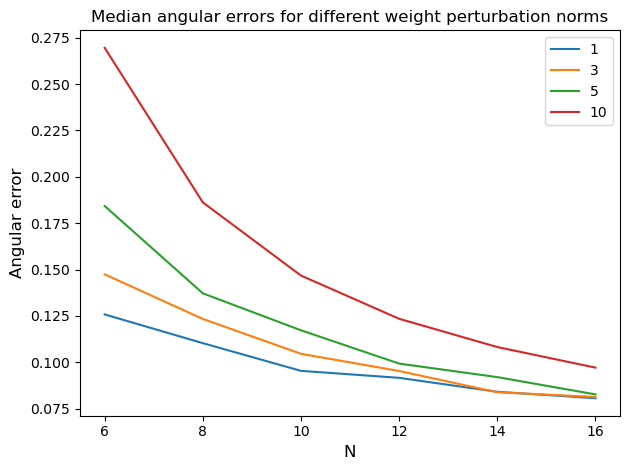

In [ ]:
filter_bool=True
filter_idx=-2
for weight_norm in weight_norms:
    print(weight_norm)
    median_angle_errors = np.load('results//{}//processed_result//median_angle_errors_weight_{}.npy'.format(timescale,weight_norm))
    plt.plot(median_angle_errors, label=f'{weight_norm}')

plt.legend()
plt.xticks(np.arange(len(median_angle_errors)),N_range)
plt.title('Median angular errors for different weight perturbation norms',fontsize=12)
plt.xlabel('N',fontsize=12)
plt.ylabel('Angular error',fontsize=12)
plt.tight_layout()
plt.savefig('results//{}//graphs//median_angular_errors_per_weight_norm_16.png'.format(timescale))

#### Variation across state noise norms

In [ ]:
filter_bool=True
filter_idx=-1
for state_norm in state_norms:
    median_angle_errors = extract_angle_errors_W_S(N_range,filter_bool,filter_idx,state_norm)
    np.save('results//{}//processed_result//median_angle_errors_state_{}.npy'.format(timescale,state_norm),median_angle_errors)

6 3.6 -2.6399999999999997 0 0
6 3.6 -2.6399999999999997 0 1
6 3.6 -2.6399999999999997 0 2
6 3.6 -2.6399999999999997 0 3
6 3.6 -2.6399999999999997 0 4
6 3.6 -2.6399999999999997 0 5
6 3.6 -2.6399999999999997 0 6
6 3.6 -2.6399999999999997 0 7
6 3.6 -2.6399999999999997 0 8
6 3.6 -2.6399999999999997 0 9
6 3.6 -2.6399999999999997 0 10
6 3.6 -2.6399999999999997 1 0
6 3.6 -2.6399999999999997 1 1
6 3.6 -2.6399999999999997 1 2
6 3.6 -2.6399999999999997 1 3
6 3.6 -2.6399999999999997 1 4
6 3.6 -2.6399999999999997 1 5
6 3.6 -2.6399999999999997 1 6
6 3.6 -2.6399999999999997 1 7
6 3.6 -2.6399999999999997 1 8
6 3.6 -2.6399999999999997 1 9
6 3.6 -2.6399999999999997 1 10
6 3.6 -2.6399999999999997 2 0
6 3.6 -2.6399999999999997 2 1
6 3.6 -2.6399999999999997 2 2
6 3.6 -2.6399999999999997 2 3
6 3.6 -2.6399999999999997 2 4
6 3.6 -2.6399999999999997 2 5
6 3.6 -2.6399999999999997 2 6
6 3.6 -2.6399999999999997 2 7
6 3.6 -2.6399999999999997 2 8
6 3.6 -2.6399999999999997 2 9
6 3.6 -2.6399999999999997 2 10
6 3.6 -

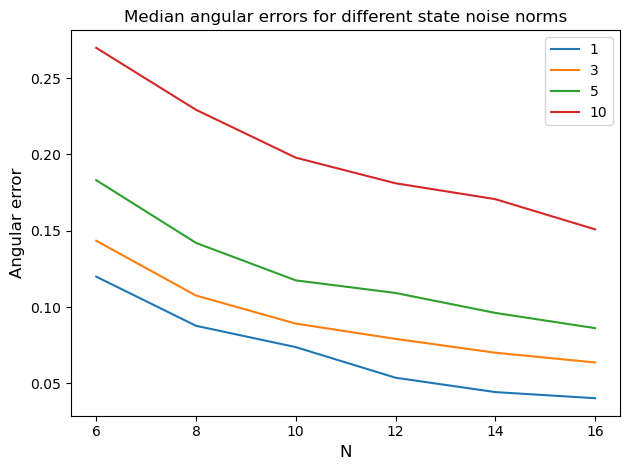

In [ ]:
filter_bool=True
filter_idx=-1
for state_norm in state_norms:
    median_angle_errors = np.load('results//{}//processed_result//median_angle_errors_state_{}.npy'.format(timescale,state_norm))
    plt.plot(median_angle_errors, label=f'{state_norm}')

plt.legend()
plt.xticks(np.arange(len(angle_errors)),N_range)
plt.title('Median angular errors for different state noise norms',fontsize=12)
plt.xlabel('N',fontsize=12)
plt.ylabel('Angular error',fontsize=12)
plt.tight_layout()
plt.savefig('results//{}//graphs//median_angular_errors_per_state_norm_16.png'.format(timescale))

#### Variation across J_Es

In [ ]:
filter_bool=True
filter_idx=1
for J_E in JEs:
    median_angle_errors = extract_angle_errors_JE_JI(N_range,filter_idx,J_E)
    np.save('results//{}//processed_result//median_angle_errors_JE_{}.npy'.format(timescale,J_E),median_angle_errors)

3.8
3.88
3.96
4.04
4.12
4.2
4.4


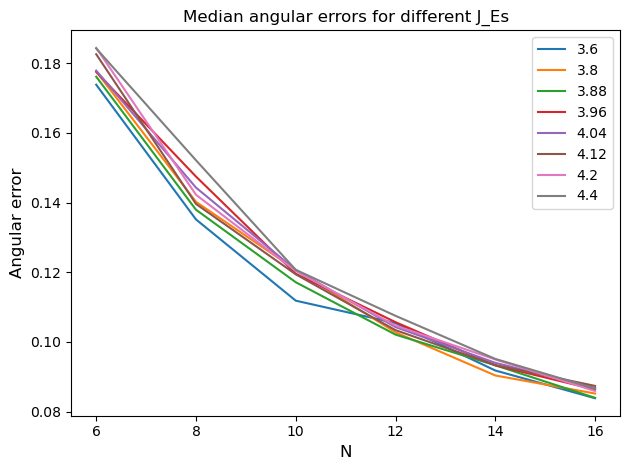

In [ ]:
filter_bool=True
filter_idx=1
for J_E in JEs:
    median_angle_errors = np.load('results//{}//processed_result//median_angle_errors_JE_{}.npy'.format(timescale,J_E))
    plt.plot(median_angle_errors, label=f'{J_E}')

plt.legend()
plt.xticks(np.arange(len(median_angle_errors)),N_range)
plt.title('Median angular errors for different $J_Es$',fontsize=12)
plt.xlabel('N',fontsize=12)
plt.ylabel('Angular error',fontsize=12)
plt.tight_layout()
plt.savefig('results//{}//graphs//median_angular_errors_per_J_E_16.png'.format(timescale))

#### Variation across J_Is

In [ ]:
filter_bool=True
filter_idx=2
for J_I in JIs:
    angle_errors = extract_angle_errors_JE_JI(N_range,filter_idx,J_I)
    np.save('results//{}//processed_result//median_angle_errors_JI_{}.npy'.format(timescale,J_I),median_angle_errors)

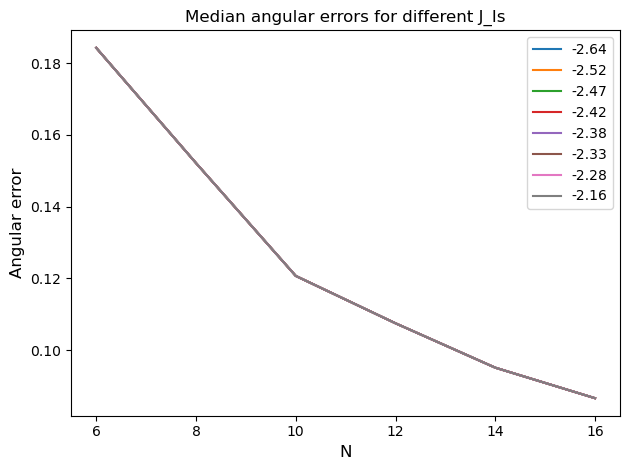

In [ ]:
filter_bool=True
filter_idx=2
for J_I in JIs:
    angle_errors = np.load('results//{}//processed_result//median_angle_errors_JI_{}.npy'.format(timescale,J_I))
    plt.plot(angle_errors, label=f'{round(J_I,2)}')

plt.legend()
plt.xticks(np.arange(len(angle_errors)),N_range)
plt.title('Median angular errors for different $J_Is$',fontsize=12)
plt.xlabel('N',fontsize=12)
plt.ylabel('Angular error',fontsize=12)
plt.tight_layout()
plt.savefig('results//{}//graphs//median_angular_errors_per_J_I_16.png'.format(timescale))

#### Trajectory visualization

9.031046457369417
[2.09537529 8.18204321 4.26289165 2.77570786 2.77570786 8.95337106
 6.58993385 0.57669237 0.57669237 5.80735053 9.04270991 3.07941546
 3.07941546 3.20418434 9.03104646 3.13453323 3.13453323 3.34404828
 5.67583705 0.45705002 0.45705002 6.91899647 5.51289022 0.75381305
 0.75381305 7.08165077 5.51674929 0.78939758 0.78939758 7.33033814
 6.68962482 0.47982819 0.47982819 5.88278836 9.59993783 2.88978142
 2.88978142 3.11046911 8.32011468 2.10946285 2.10946285 4.1802989
 7.79040817 1.49753994 1.49753994 4.79189051 8.12122274 1.70898996
 1.70898996 4.58175859 9.41348687 2.89176108 2.89176108 3.62242337
 6.90427847 0.82026071 0.82026071 5.37578696 5.70791816 0.55152025
 0.55152025 6.82131016 4.08400697 2.09537529]


Text(0.5, 1.0, 'Angular error: 8 degrees')

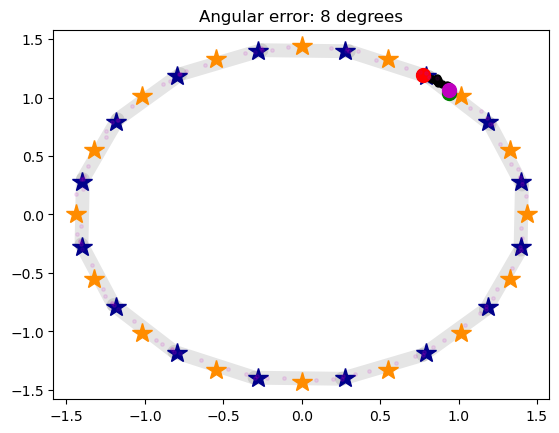

In [ ]:
seed, norm = seeds[0], norms[4]
N=16
J_E, J_I = 7,-14
trajectory_index=14
intermediate_timestep = 1

corners, all_bumps, W_sym, W_asym = get_network_with_automatic_corners(N,J_E,J_I,t)
corners_max = np.abs(corners).max()

noises = get_perturbation(seed,norm,corners_max,N,t)

trajectories = get_trajectories(all_bumps,W_sym, W_asym, t, N, noises) 

fixed_points = noorman_fixed_points(W_sym, c_ff)[:-1]

stable_points, saddle_points = [], []
for fixed_point in fixed_points:
        eigenvalues, _ = scipy.linalg.eig(noorman_jacobian(fixed_point, W_sym))
        if np.all(np.real(eigenvalues)<0):
                stable_points.append(fixed_point)
        else:
                saddle_points.append(fixed_point)
stable_points = np.array(stable_points)
saddle_points = np.array(saddle_points)
#print(len(fixed_points))

inv_man = detect_slow_manifold(trajectories,tol=1e-2)

print(np.degrees(np.abs(get_angle_from_bump(trajectories[trajectory_index,-1])[0] - get_angle_from_bump(trajectories[trajectory_index,0])[0])))

angle_diffs, peak_location_diffs = np.array(get_angle_diffs(trajectories))
print(angle_diffs)

plot_trajectory_and_invariant_manifold(corners,inv_man,fixed_points,trajectories,trajectory_index,N, W_sym,intermediate_timestep)
with open("results//all_JE_JI//state_noise//angle_errors_{}_{}_{}.pkl".format(N,J_E,J_I), "rb") as f:
        results = pickle.load(f)
angle_error = results[N,J_E,J_I,seed,norm]
plt.title('Angular error: {} degrees'.format(round(angle_error[trajectory_index])))

### Get saddle point boundary crossings

In [ ]:
def find_2_closest_saddles(saddle_points,bump):
    saddle_angles=[]
    for saddle_point in saddle_points:
        saddle_angle = get_angle_from_bump(saddle_point)[0]
        saddle_angles.append(saddle_angle)
    saddle_angles = np.array(saddle_angles)

    saddle_angles = saddle_angles % (2*np.pi)
    sorted_indices = np.argsort(saddle_angles)
    sorted_angles = saddle_angles[sorted_indices]

    bump_angle = get_angle_from_bump(bump)[0]
    bump_angle = bump_angle % (2*np.pi)

    # Find the position where target_angle would be inserted
    insert_pos = np.searchsorted(sorted_angles, bump_angle)

    # Get indices of surrounding angles
    if insert_pos == 0:
        lower_idx = sorted_indices[-1]  # Wrap around
        upper_idx = sorted_indices[0]
    elif insert_pos == len(saddle_angles):
        lower_idx = sorted_indices[-1]
        upper_idx = sorted_indices[0]  # Wrap around
    else:
        lower_idx = sorted_indices[insert_pos - 1]
        upper_idx = sorted_indices[insert_pos]

    return saddle_angles[lower_idx], saddle_angles[upper_idx]

def is_angle_between(target, angle1, angle2):
    """Check if target angle is between angle1 and angle2 in circular radians."""

    # If angle1 is less than angle2, check normally
    if angle1 < angle2:
        return angle1 <= target <= angle2
    else:  # Handles the case where wrapping occurs (across 0 radians)
        return target >= angle1 or target <= angle2
    
def angular_distance(angle1, angle2):
    """Find the shortest distance between two angles in radians."""
    diff = np.abs(angle2 - angle1)  # Absolute difference
    return min(diff, 2 * np.pi - diff)  # Consider wrap-around case
    
def check_trajectory_within_bounds(trajectory,min_angle,max_angle):

    boundary_crossings = 0
    maximum_dist_2_range = 0
    for state in trajectory:
        state_angle = get_angle_from_bump(state)[0]
        # Normalize values to 2pi
        state_angle = state_angle % (2 * np.pi)

        if not is_angle_between(state_angle,min_angle,max_angle):
            boundary_crossings += 1
            
            # calculate distance from trajectory point to saddle points
            dist_2_min = angular_distance(state_angle, min_angle)
            dist_2_max = angular_distance(state_angle, max_angle)
            dist_2_range = min(dist_2_min,dist_2_max)
            maximum_dist_2_range = max(maximum_dist_2_range,dist_2_range)

    return boundary_crossings, maximum_dist_2_range


In [ ]:
n_possible_combinations=0
with open("results//all_JE_JI//fixed_points_N6_N18", "rb") as f:
        all_fixed_points = pickle.load(f)
for idx, key in enumerate(list(all_fixed_points.keys())):
        if all_fixed_points[key] is not None:
                n_possible_combinations+=1
print(n_possible_combinations)

449


In [ ]:
seed = seeds[0]

all_boundary_crossings = {}
for norm in norms:
    for idx, key in enumerate(list(all_fixed_points.keys())):
        if all_fixed_points[key] is not None:
            print('\nnorm',norm,'N J_E J_I',key)
            N, J_E, J_I = key[0], key[1], key[2]

            corners, all_bumps, W_sym, W_asym = get_network_with_automatic_corners(N,J_E,J_I,t)
            corners_max = np.abs(corners).max() 

            # Get trajectories
            # use only bumps that start from the middle of a saddle-stable point interval
            range_middle_interval = np.arange(round(all_bumps.shape[0]/N/2), round((N-1) * all_bumps.shape[0]/N + all_bumps.shape[0]/N/2), all_bumps.shape[0]/N).astype(int)
            noises = get_perturbation(seed,norm,corners_max,N,t)
            trajectories = get_trajectories(all_bumps[range_middle_interval],W_sym, W_asym, t, N, noises)
            
            # Get fixed points
            fixed_points = all_fixed_points[N,J_E,J_I] #all_fixed_points[key]
            stable_points, saddle_points = [], []
            for fixed_point in fixed_points:
                eigenvalues, _ = scipy.linalg.eig(noorman_jacobian(fixed_point, W_sym))
                if np.all(np.real(eigenvalues)<0):
                    stable_points.append(fixed_point)
                else:
                    saddle_points.append(fixed_point)
            saddle_points = np.array(saddle_points)

            if len(saddle_points) > 2: # need at least 2 saddle points in order to extract the closest 2 saddle points
                # Find 2 closest saddle points and check whether the trajectory states stay within these 2 bounds
                all_boundary_crossings_per_key = []
                for trajectory in trajectories:
                    min_angle, max_angle = find_2_closest_saddles(saddle_points,trajectory[0])
                    boundary_crossings, maximum_dist_2_range = check_trajectory_within_bounds(trajectory,min_angle,max_angle)
                    if boundary_crossings > 0:
                        all_boundary_crossings_per_key.append([boundary_crossings, maximum_dist_2_range])
                if len(all_boundary_crossings_per_key) > 0:
                    all_boundary_crossings[(norm,N,J_E,J_I)] = all_boundary_crossings_per_key
    


norm 1 N J_E J_I (6, 10, -6)

norm 1 N J_E J_I (6, 10, -7)

norm 1 N J_E J_I (6, 10, -8)

norm 1 N J_E J_I (6, 10, -9)

norm 1 N J_E J_I (6, 10, -10)

norm 1 N J_E J_I (6, 10, -11)

norm 1 N J_E J_I (6, 10, -12)

norm 1 N J_E J_I (6, 10, -13)

norm 1 N J_E J_I (6, 10, -14)

norm 1 N J_E J_I (6, 9, -5)

norm 1 N J_E J_I (6, 9, -6)

norm 1 N J_E J_I (6, 9, -7)

norm 1 N J_E J_I (6, 9, -8)

norm 1 N J_E J_I (6, 9, -9)

norm 1 N J_E J_I (6, 9, -10)

norm 1 N J_E J_I (6, 9, -11)

norm 1 N J_E J_I (6, 9, -12)

norm 1 N J_E J_I (6, 9, -13)

norm 1 N J_E J_I (6, 9, -14)

norm 1 N J_E J_I (6, 8, -5)

norm 1 N J_E J_I (6, 8, -6)

norm 1 N J_E J_I (6, 8, -7)

norm 1 N J_E J_I (6, 8, -8)

norm 1 N J_E J_I (6, 8, -9)

norm 1 N J_E J_I (6, 8, -10)

norm 1 N J_E J_I (6, 8, -11)

norm 1 N J_E J_I (6, 8, -12)

norm 1 N J_E J_I (6, 8, -13)

norm 1 N J_E J_I (6, 8, -14)

norm 1 N J_E J_I (6, 7, -4)

norm 1 N J_E J_I (6, 7, -5)

norm 1 N J_E J_I (6, 7, -6)

norm 1 N J_E J_I (6, 7, -7)

norm 1 N J_E J_I (

In [ ]:
with open("results//all_JE_JI//state_noise_saddle_boundary_crossings.pkl", "wb") as f:
            pickle.dump(all_boundary_crossings, f)

### Analyze saddle point boundary crossings

In [ ]:
with open("results//all_JE_JI//state_noise_saddle_boundary_crossings.pkl", "wb") as f:
            pickle.load(all_boundary_crossings, f)

In [ ]:
norm_count, N_count, maximum_dists_2_range_per_norm, maximum_dists_2_range_per_N = {}, {}, {}, {}
for norm in norms:
    norm_count[norm] = 0
for N in np.arange(6,20,2):
    N_count[N] = 0

for norm in norms:
    maximum_dists_2_range_per_norm[norm] = 0
for N in np.arange(6,20,2):
    maximum_dists_2_range_per_N[N] = 0

for key in list(all_boundary_crossings.keys()):
    norm, N, J_E, J_I = key[0],key[1],key[2],key[3]
    norm_count[norm] += 1
    N_count[N] += 1
    
    all_boundary_crossings_per_key = np.array(all_boundary_crossings[key])
    boundary_crossings = np.max(all_boundary_crossings_per_key[:,0])
    maximum_dist_2_range = np.max(np.degrees(all_boundary_crossings_per_key[:,1]))
    print(key,maximum_dist_2_range)

    maximum_dists_2_range_per_norm[norm] = max(maximum_dists_2_range_per_norm[norm],maximum_dist_2_range)
    maximum_dists_2_range_per_N[N] = max(maximum_dists_2_range_per_N[N],maximum_dist_2_range)


(1, 10, 7, -14) 0.6051474923571765
(1, 16, 5, -14) 1.4668892402683233
(5, 10, 7, -14) 3.527775583552006
(5, 14, 9, -8) 0.2521934495677447
(5, 16, 9, -9) 2.138023697743548
(5, 16, 5, -14) 5.905446955719594
(10, 10, 7, -13) 1.1292970022877347
(10, 10, 7, -14) 6.5350899055806035
(10, 14, 9, -7) 0.5384314244557468
(10, 14, 9, -8) 1.9880629581643356
(10, 14, 5, -4) 6.537966306506949
(10, 14, 3, -12) 0.7014641702841189
(10, 16, 9, -9) 8.765611180215458
(10, 16, 5, -14) 7.118961203343793
(10, 16, 3, -8) 0.01542281002469782
(10, 18, 10, -7) 4.659769135808876
(20, 10, 7, -13) 8.717383902312346
(20, 10, 7, -14) 14.241298116618953
(20, 10, 4, -8) 0.1063932582168231
(20, 14, 9, -6) 0.5286898532228563
(20, 14, 9, -7) 2.8285051608566487
(20, 14, 9, -8) 5.793786648280404
(20, 14, 5, -4) 10.422275963924806
(20, 14, 3, -11) 5.2273952001969715
(20, 14, 3, -12) 5.6487196306839715
(20, 16, 9, -9) 10.732893222600861
(20, 16, 5, -14) 8.429993951262198
(20, 16, 3, -8) 1.514289100928308
(20, 18, 10, -6) 5.505

#### How far does the state go after crossing a boundary?

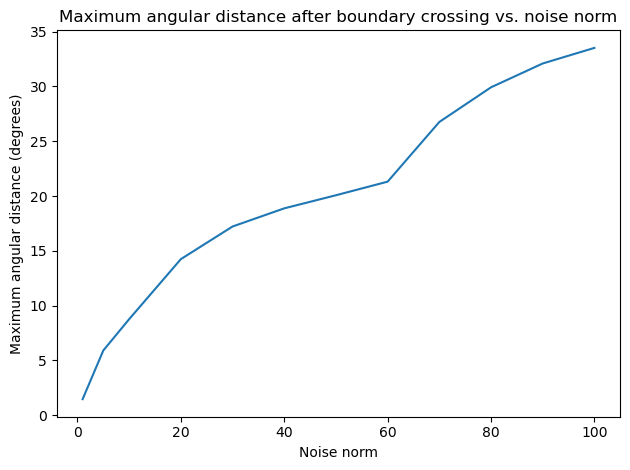

In [ ]:
plt.plot(norms,maximum_dists_2_range_per_norm.values())
plt.title('Maximum angular distance after boundary crossing vs. noise norm',fontsize=12)
plt.xlabel('Noise norm')
plt.ylabel('Maximum angular distance (degrees)')
plt.tight_layout()
plt.savefig('results//graphs//state_boundary_crossings_dist_per_norm')

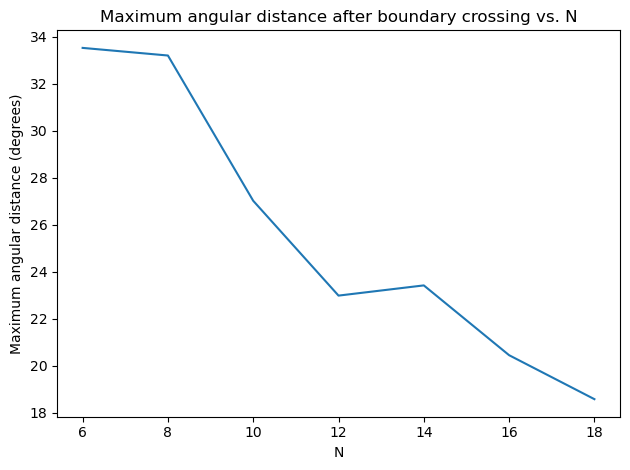

In [ ]:
plt.plot(np.arange(6,20,2),maximum_dists_2_range_per_N.values())
plt.title('Maximum angular distance after boundary crossing vs. N')
plt.xlabel('N')
plt.ylabel('Maximum angular distance (degrees)')
plt.tight_layout()
plt.savefig('results//graphs//state_boundary_crossings_dist_per_N')

#### How frequent are boundary crossings?

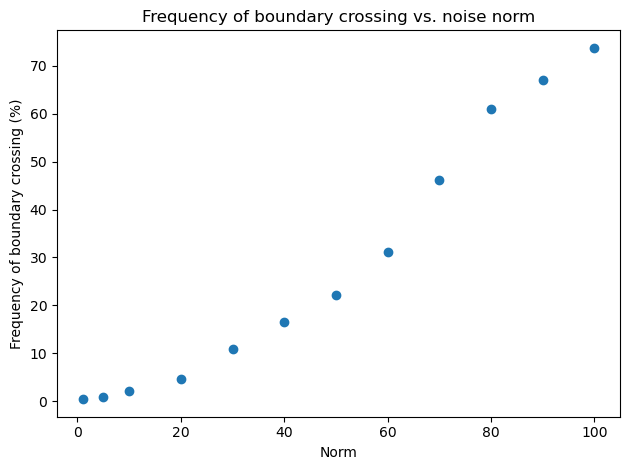

In [ ]:
plt.scatter(list(norm_count.keys()),np.array(list(norm_count.values()))/n_possible_combinations*100)
plt.xlabel('Norm')
plt.ylabel('Frequency of boundary crossing (%)')
plt.title('Frequency of boundary crossing vs. noise norm',fontsize=12)
plt.tight_layout()
plt.savefig('results//graphs//state_boundary_crossings_freq_per_norm')

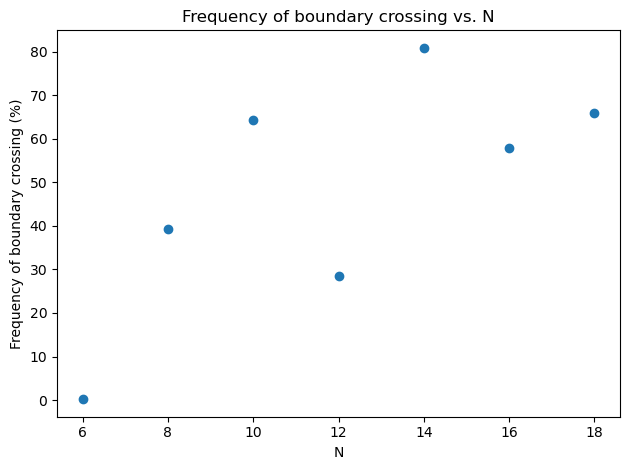

In [ ]:
plt.scatter(list(N_count.keys()),np.array(list(N_count.values()))/n_possible_combinations*100)
plt.xlabel('N')
plt.ylabel('Frequency of boundary crossing (%)')
plt.title('Frequency of boundary crossing vs. N',fontsize=12)
plt.tight_layout()
plt.savefig('results//graphs//state_boundary_crossings_freq_per_N')